In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl
import math

def instantaneous_accelerate(p0, p1, p2, fps):
    """ combined acceleration """
    x0, y0 = p0
    x1, y1 = p1
    x2, y2 = p2

    vx0 = (x1 - x0) * fps
    vy0 = (y1 - y0) * fps

    vx1 = (x2 - x1) * fps
    vy1 = (y2 - y1) * fps

    ax = (vx1 - vx0) * fps
    ay = (vy1 - vy0) * fps
    
    a_magnitude = np.sqrt(ax**2 + ay**2)

    return a_magnitude

def data_tidy(file_path, fps):
    """ Preliminary data organization: acceleration and velocity(px/f or px/s^2)
        -> "trajectories_tidy" foler
    """
    ifile = open(file_path, "r")
    reader = csv.DictReader(ifile)

    if not os.path.exists("trajectories_tidy"):
        os.makedirs("trajectories_tidy")

    output_path = os.path.join("trajectories_tidy", os.path.basename(file_path))

    lines = []

    with open(output_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["frame","x","y","roi_x","roi_y","area","velocity_x","velocity_y", "velocity", "acceleration"])

        next(reader)
        for line in reader:
            lines.append(line)
        
        last_point = None
        
        for i in range(len(lines)):
            line = lines[i]
            frame = line["frame"]
            x,y = (int(line["cx"]), int(line["cy"]))
            roi_x, roi_y = (line["roi_x"], line["roi_y"])
            area = int(line["w"]) * int(line["h"])
            if last_point:
                velocity_x = (x - last_point[0]) / (int(line["frame"]) - int(lines[i-1]["frame"]))
                velocity_y = (y - last_point[1]) / (int(line["frame"]) - int(lines[i-1]["frame"]))
                velocity = np.sqrt(velocity_x**2 + velocity_y**2)
                if i < (len(lines)-1):
                    p0 = (last_point[0], last_point[1])
                    p1 = (x, y)
                    p2 = (int(lines[i+1]["cx"]), int(lines[i+1]["cy"]))
                    acc = instantaneous_accelerate(p0, p1, p2, fps)
                else:
                    acc = last_point[2]
            else:
                velocity_x = 0
                velocity_y = 0
                velocity = 0
                p1 = (x, y)
                p2 = (int(lines[i+1]["cx"]), int(lines[i+1]["cy"]))
                acc = instantaneous_accelerate(p1, p1, p2, fps)
            
            last_point = [x, y, acc]
            writer.writerow([frame,x,y,roi_x,roi_y,area,velocity_x,velocity_y,velocity,acc])
    return output_path


for file in os.listdir("trajectories"):
    data_tidy(f"trajectories/{file}", 30)


In [2]:
""" Average on every seconds
-> [02,07]_average.csv
"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl
import math

csv_file = "02_average.csv"

fo = open(csv_file, "w", newline='')
writer = csv.DictWriter(fo, fieldnames=["time", "velocity_x", "velocity_y", "velocity", "acceleration"])
writer.writeheader()

vels = {}

folder = "trajectories_tidy_group_removed/02"
files = os.listdir(folder)
for file in files:
    with open(os.path.join(folder, file), "r") as fi:
        reader = csv.DictReader(fi)
        for line in reader:
            if float(line["acceleration"]) >= 10000 or float(line["frame"]) > 1500 * 30:
                continue
            k = int(int(line["frame"]) / 30)
            if k not in vels:
                vels[k] = [[float(line["velocity"])], [float(line["acceleration"])], [abs(float(line["velocity_x"]))], [abs(float(line["velocity_y"]))]]
            else:
                vels[k][0].append(float(line["velocity"]))
                vels[k][1].append(float(line["acceleration"]))
                vels[k][2].append(abs(float(line["velocity_x"])))
                vels[k][3].append(abs(float(line["velocity_y"])))

vels = dict(sorted(vels.items()))
for line in vels:
    writer.writerow({
        "time": line,
        "velocity": sum(vels[line][0])/len(vels[line][0]),
        "acceleration": sum(vels[line][1])/len(vels[line][1]),
        "velocity_x": sum(vels[line][2])/len(vels[line][2]),
        "velocity_y": sum(vels[line][3])/len(vels[line][3]),
    })
fo.close()

#####

csv_file = "07_average.csv"

fo = open(csv_file, "w", newline='')
writer = csv.DictWriter(fo, fieldnames=["time", "velocity_x", "velocity_y", "velocity", "acceleration"])
writer.writeheader()

vels = {}

folder = "trajectories_tidy_group_removed/07"
files = os.listdir(folder)
for file in files:
    with open(os.path.join(folder, file), "r") as fi:
        reader = csv.DictReader(fi)
        for line in reader:
            if float(line["acceleration"]) >= 10000 or float(line["frame"]) > 1500 * 30:
                continue
            k = int(int(line["frame"]) / 30)
            if k not in vels:
                vels[k] = [[float(line["velocity"])], [float(line["acceleration"])], [abs(float(line["velocity_x"]))], [abs(float(line["velocity_y"]))]]
            else:
                vels[k][0].append(float(line["velocity"]))
                vels[k][1].append(float(line["acceleration"]))
                vels[k][2].append(abs(float(line["velocity_x"])))
                vels[k][3].append(abs(float(line["velocity_y"])))

vels = dict(sorted(vels.items()))
for line in vels:
    writer.writerow({
        "time": line,
        "velocity": sum(vels[line][0])/len(vels[line][0]),
        "acceleration": sum(vels[line][1])/len(vels[line][1]),
        "velocity_x": sum(vels[line][2])/len(vels[line][2]),
        "velocity_y": sum(vels[line][3])/len(vels[line][3]),
    })
fo.close()

In [8]:
""" Unit conversion
    -> [02,07]_average_cm.csv
    1px/f = 1.875 cm/s
    1px/s² = 0.0625 cm/s²
"""
import csv

lines = []
with open("./02_average.csv", "r", encoding="utf-8") as f:
    reader = csv.reader(f)
    next(reader)

    for line in reader:
        line.append(float(line[1]) * 1.875)
        line.append(float(line[2]) * 1.875)
        line.append(float(line[3]) * 1.875)
        line.append(float(line[4]) * 0.0625)
        lines.append(line)

with open("./02_average_cm.csv", "w", newline='', encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow(["time","velocity_x", "velocity_y", "velocity","acceleration", "velocity_x(cm/s)", "velocity_y(cm/s)","velocity(cm/s)","acceleration(cm/s²)"])

    writer.writerows(lines)

######
lines = []
with open("./07_average.csv", "r", encoding="utf-8") as f:
    reader = csv.reader(f)
    next(reader)

    for line in reader:
        line.append(float(line[1]) * 1.875)
        line.append(float(line[2]) * 1.875)
        line.append(float(line[3]) * 1.875)
        line.append(float(line[4]) * 0.0625)
        lines.append(line)

with open("./07_average_cm.csv", "w", newline='', encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow(["time","velocity_x", "velocity_y", "velocity","acceleration", "velocity_x(cm/s)", "velocity_y(cm/s)","velocity(cm/s)","acceleration(cm/s²)"])

    writer.writerows(lines)

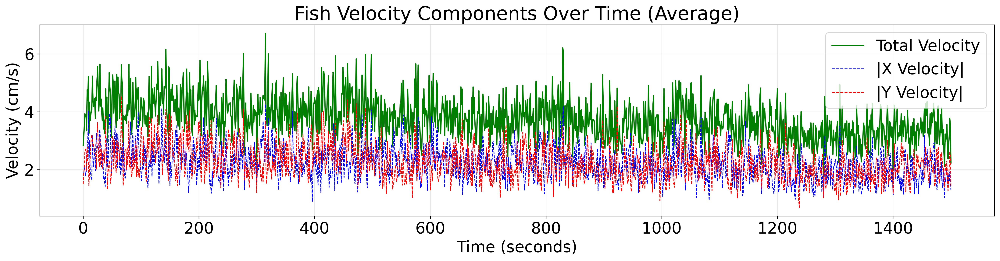

In [9]:
""" draw 02(old) group velocity plot """
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl


# default_fontsize = mpl.rcParams['font.size'] = 10.0
mpl.rcParams['font.size'] = 20

csv_file = "02_average_cm.csv"

df = pd.read_csv(csv_file)

# df = df.query('acceleration < 10000')

# Extract filename for plot titles
filename = os.path.basename(csv_file)

# Create figure with subplots
fig = plt.figure(figsize=(18, 5), dpi=300)

# Calculate total velocity from velocity_x and velocity_y
df['velocity'] = df['velocity(cm/s)']

# Plot velocity components over time
plt.plot(df['time'], df['velocity'], 'g-', linewidth=1.5, label='Total Velocity')
plt.plot(df['time'], np.abs(df['velocity_x(cm/s)']), 'b--', linewidth=1, label='|X Velocity|')
plt.plot(df['time'], np.abs(df['velocity_y(cm/s)']), 'r--', linewidth=1, label='|Y Velocity|')

# Set labels and title
plt.xlabel('Time (seconds)')
plt.ylabel('Velocity (cm/s)')
# plt.ylim(top=3.5)
plt.title('Fish Velocity Components Over Time (Average)')

# Add grid and legend
plt.grid(True, alpha=0.3)
plt.legend()


# Adjust layout
plt.tight_layout()

# Save the figure
# output_file = os.path.splitext(csv_file)[0] + '_analysis.png'
# # plt.savefig(output_file, dpi=300)
# print(f"Plot saved to {output_file}")

# Show the plot
# plt.show()

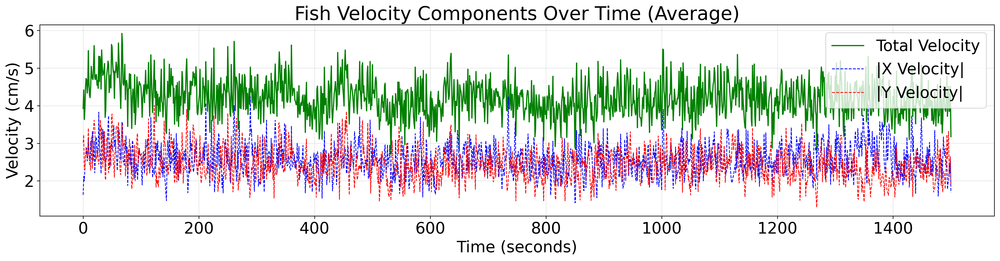

In [10]:
""" draw 07(young) group velocity plot """
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl


# default_fontsize = mpl.rcParams['font.size'] = 10.0
mpl.rcParams['font.size'] = 20

csv_file = "07_average_cm.csv"

df = pd.read_csv(csv_file)

# df = df.query('acceleration < 10000')

# Extract filename for plot titles
filename = os.path.basename(csv_file)

# Create figure with subplots
fig = plt.figure(figsize=(18, 5), dpi=300)

# Calculate total velocity from velocity_x and velocity_y
df['velocity'] = df['velocity(cm/s)']

# Plot velocity components over time
plt.plot(df['time'], df['velocity'], 'g-', linewidth=1.5, label='Total Velocity')
plt.plot(df['time'], np.abs(df['velocity_x(cm/s)']), 'b--', linewidth=1, label='|X Velocity|')
plt.plot(df['time'], np.abs(df['velocity_y(cm/s)']), 'r--', linewidth=1, label='|Y Velocity|')

# Set labels and title
plt.xlabel('Time (seconds)')
plt.ylabel('Velocity (cm/s)')
# plt.ylim(top=3.5)
plt.title('Fish Velocity Components Over Time (Average)')

# Add grid and legend
plt.grid(True, alpha=0.3)
plt.legend()


# Adjust layout
plt.tight_layout()

# Save the figure
# output_file = os.path.splitext(csv_file)[0] + '_analysis.png'
# # plt.savefig(output_file, dpi=300)
# print(f"Plot saved to {output_file}")

# Show the plot
# plt.show()

Applied Savitzky-Golay filter with window size 51 and polynomial order 3
Applied Savitzky-Golay filter with window size 51 and polynomial order 3


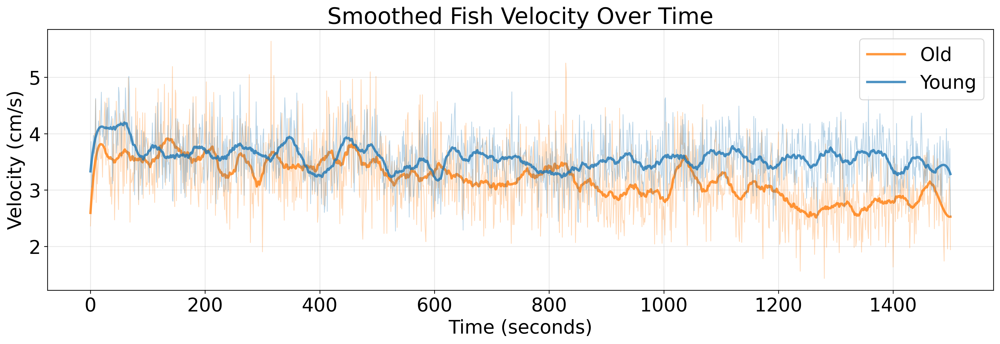

In [11]:
""" draw smoothed velocity plot on two groups """
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import savgol_filter
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl

mpl.rcParams['font.size'] = 20
dd = pd.DataFrame()

csv_file = "02_average_cm.csv"
df = pd.read_csv(csv_file)  
dd['velocity_02'] = np.sqrt(df['velocity_x(cm/s)']**2 + df['velocity_y(cm/s)']**2)

csv_file = "07_average_cm.csv"
df = pd.read_csv(csv_file)
dd['velocity_07'] = np.sqrt(df['velocity_x(cm/s)']**2 + df['velocity_y(cm/s)']**2)

# dd.to_csv("dd.csv")

fig = plt.figure(figsize=(18, 5), dpi=300)

# Calculate smoothed velocity
smoothed_velocity = None
try:
    # Apply Savitzky-Golay filter for smoothing
    if len(df) > 10:  # Need enough points for smoothing
        # Calculate window size (must be odd and less than data length)
        window_size = min(51, len(df) - (1 if len(df) % 2 == 0 else 0))
        # Ensure window size is odd
        window_size = window_size if window_size % 2 == 1 else window_size - 1
        # Polynomial order (must be less than window_size)
        poly_order = min(3, window_size - 1)
        
        if window_size > poly_order:
            # Apply Savitzky-Golay filter
            smoothed_velocity = savgol_filter(dd['velocity_02'], window_size, poly_order)
            plt.plot(df['time'], smoothed_velocity, '#ff7e0d', linewidth=2.5, alpha=0.8, label="Old")
            print(f"Applied Savitzky-Golay filter with window size {window_size} and polynomial order {poly_order}")
        else:
            # Use simple moving average if not enough points for Savitzky-Golay
            window = max(3, len(dd)//10)
            smoothed_velocity = dd['velocity_02'].rolling(window=window, center=True).mean()
            plt.plot(df['time'], smoothed_velocity, '#ff7e0d', linewidth=2.5, alpha=0.8)
            print(f"Applied moving average with window size {window}")
            
        # Add the original velocity as a light background line for reference
        plt.plot(df['time'], dd['velocity_02'], '#ff7e0d', linewidth=0.8, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Insufficient data for smoothing', 
                horizontalalignment='center', verticalalignment='center',
                transform=plt.transAxes, fontsize=14)
except Exception as e:
    print(f"Warning: Could not create smoothed velocity curve: {e}")
    plt.text(0.5, 0.5, f'Error creating smoothed curve: {str(e)}', 
            horizontalalignment='center', verticalalignment='center',
            transform=plt.transAxes, fontsize=12)

# Calculate smoothed velocity
smoothed_velocity = None
try:
    # Apply Savitzky-Golay filter for smoothing
    if len(df) > 10:  # Need enough points for smoothing
        # Calculate window size (must be odd and less than data length)
        window_size = min(51, len(df) - (1 if len(df) % 2 == 0 else 0))
        # Ensure window size is odd
        window_size = window_size if window_size % 2 == 1 else window_size - 1
        # Polynomial order (must be less than window_size)
        poly_order = min(3, window_size - 1)
        
        if window_size > poly_order:
            # Apply Savitzky-Golay filter
            smoothed_velocity = savgol_filter(dd['velocity_07'], window_size, poly_order)
            plt.plot(df['time'], smoothed_velocity, '#1f77b4', linewidth=2.5, alpha=0.8, label="Young")
            print(f"Applied Savitzky-Golay filter with window size {window_size} and polynomial order {poly_order}")
        else:
            # Use simple moving average if not enough points for Savitzky-Golay
            window = max(3, len(dd)//10)
            smoothed_velocity = dd['velocity_07'].rolling(window=window, center=True).mean()
            plt.plot(df['time'], smoothed_velocity, '#1f77b4', linewidth=2.5, alpha=0.8)
            print(f"Applied moving average with window size {window}")
            
        # Add the original velocity as a light background line for reference
        plt.plot(df['time'], dd['velocity_07'], '#1f77b4', linewidth=0.8, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Insufficient data for smoothing', 
                horizontalalignment='center', verticalalignment='center',
                transform=plt.transAxes, fontsize=14)
except Exception as e:
    print(f"Warning: Could not create smoothed velocity curve: {e}")
    plt.text(0.5, 0.5, f'Error creating smoothed curve: {str(e)}', 
            horizontalalignment='center', verticalalignment='center',
            transform=plt.transAxes, fontsize=12)

# Set labels and title
plt.xlabel('Time (seconds)')
plt.ylabel('Velocity (cm/s)')
plt.title('Smoothed Fish Velocity Over Time')

# Add grid and legend
plt.grid(True, alpha=0.3)
plt.legend()

Applied Savitzky-Golay filter with window size 51 and polynomial order 3
Applied Savitzky-Golay filter with window size 51 and polynomial order 3


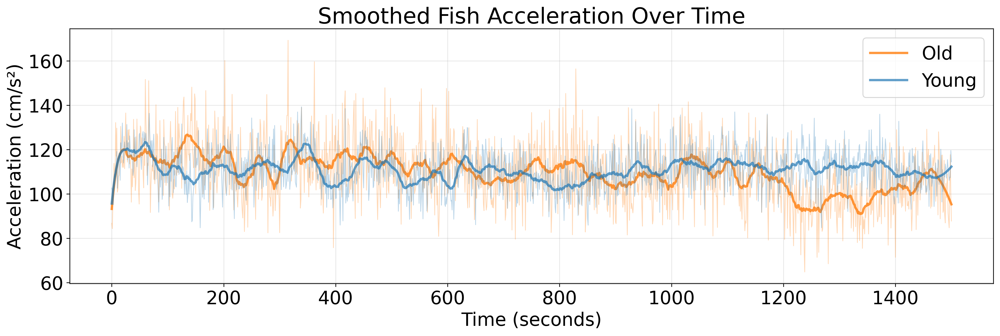

In [12]:
""" draw smoothed acceleration plot on two groups """
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import savgol_filter
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl

mpl.rcParams['font.size'] = 20
dd = pd.DataFrame()

csv_file = "02_average_cm.csv"
df = pd.read_csv(csv_file)  

dd['acceleration_02'] = df['acceleration(cm/s²)']
csv_file = "07_average_cm.csv"
df = pd.read_csv(csv_file)
dd['acceleration_07'] = df['acceleration(cm/s²)']

fig = plt.figure(figsize=(18, 5), dpi=300)

# Calculate smoothed acceleration
smoothed_acceleration = None
try:
    # Apply Savitzky-Golay filter for smoothing
    if len(df) > 10:  # Need enough points for smoothing
        # Calculate window size (must be odd and less than data length)
        window_size = min(51, len(df) - (1 if len(df) % 2 == 0 else 0))
        # Ensure window size is odd
        window_size = window_size if window_size % 2 == 1 else window_size - 1
        # Polynomial order (must be less than window_size)
        poly_order = min(3, window_size - 1)
        
        if window_size > poly_order:
            # Apply Savitzky-Golay filter
            smoothed_acceleration = savgol_filter(dd['acceleration_02'], window_size, poly_order)
            plt.plot(df['time'], smoothed_acceleration, '#ff7e0d', linewidth=2.5, alpha=0.8, label="Old")
            print(f"Applied Savitzky-Golay filter with window size {window_size} and polynomial order {poly_order}")
        else:
            # Use simple moving average if not enough points for Savitzky-Golay
            window = max(3, len(dd)//10)
            smoothed_acceleration = dd['acceleration_02'].rolling(window=window, center=True).mean()
            plt.plot(df['time'], smoothed_acceleration, '#ff7e0d', linewidth=2.5, alpha=0.8)
            print(f"Applied moving average with window size {window}")
            
        # Add the original acceleration as a light background line for reference
        plt.plot(df['time'], dd['acceleration_02'], '#ff7e0d', linewidth=0.8, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Insufficient data for smoothing', 
                horizontalalignment='center', verticalalignment='center',
                transform=plt.transAxes, fontsize=14)
except Exception as e:
    print(f"Warning: Could not create smoothed acceleration curve: {e}")
    plt.text(0.5, 0.5, f'Error creating smoothed curve: {str(e)}', 
            horizontalalignment='center', verticalalignment='center',
            transform=plt.transAxes, fontsize=12)

# Calculate smoothed acceleration
smoothed_acceleration = None
try:
    # Apply Savitzky-Golay filter for smoothing
    if len(df) > 10:  # Need enough points for smoothing
        # Calculate window size (must be odd and less than data length)
        window_size = min(51, len(df) - (1 if len(df) % 2 == 0 else 0))
        # Ensure window size is odd
        window_size = window_size if window_size % 2 == 1 else window_size - 1
        # Polynomial order (must be less than window_size)
        poly_order = min(3, window_size - 1)
        
        if window_size > poly_order:
            # Apply Savitzky-Golay filter
            smoothed_acceleration = savgol_filter(dd['acceleration_07'], window_size, poly_order)
            plt.plot(df['time'], smoothed_acceleration, '#1f77b4', linewidth=2.5, alpha=0.7, label="Young")
            print(f"Applied Savitzky-Golay filter with window size {window_size} and polynomial order {poly_order}")
        else:
            # Use simple moving average if not enough points for Savitzky-Golay
            window = max(3, len(dd)//10)
            smoothed_acceleration = dd['acceleration_07'].rolling(window=window, center=True).mean()
            plt.plot(df['time'], smoothed_acceleration, '#1f77b4', linewidth=2.5, alpha=0.7)
            print(f"Applied moving average with window size {window}")
            
        # Add the original acceleration as a light background line for reference
        plt.plot(df['time'], dd['acceleration_07'], '#1f77b4', linewidth=0.8, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'Insufficient data for smoothing', 
                horizontalalignment='center', verticalalignment='center',
                transform=plt.transAxes, fontsize=14)
except Exception as e:
    print(f"Warning: Could not create smoothed acceleration curve: {e}")
    plt.text(0.5, 0.5, f'Error creating smoothed curve: {str(e)}', 
            horizontalalignment='center', verticalalignment='center',
            transform=plt.transAxes, fontsize=12)

# Set labels and title
plt.xlabel('Time (seconds)')
plt.ylabel('Acceleration (cm/s²)')
plt.title('Smoothed Fish Acceleration Over Time')

# Add grid and legend
plt.grid(True, alpha=0.3)
plt.legend()

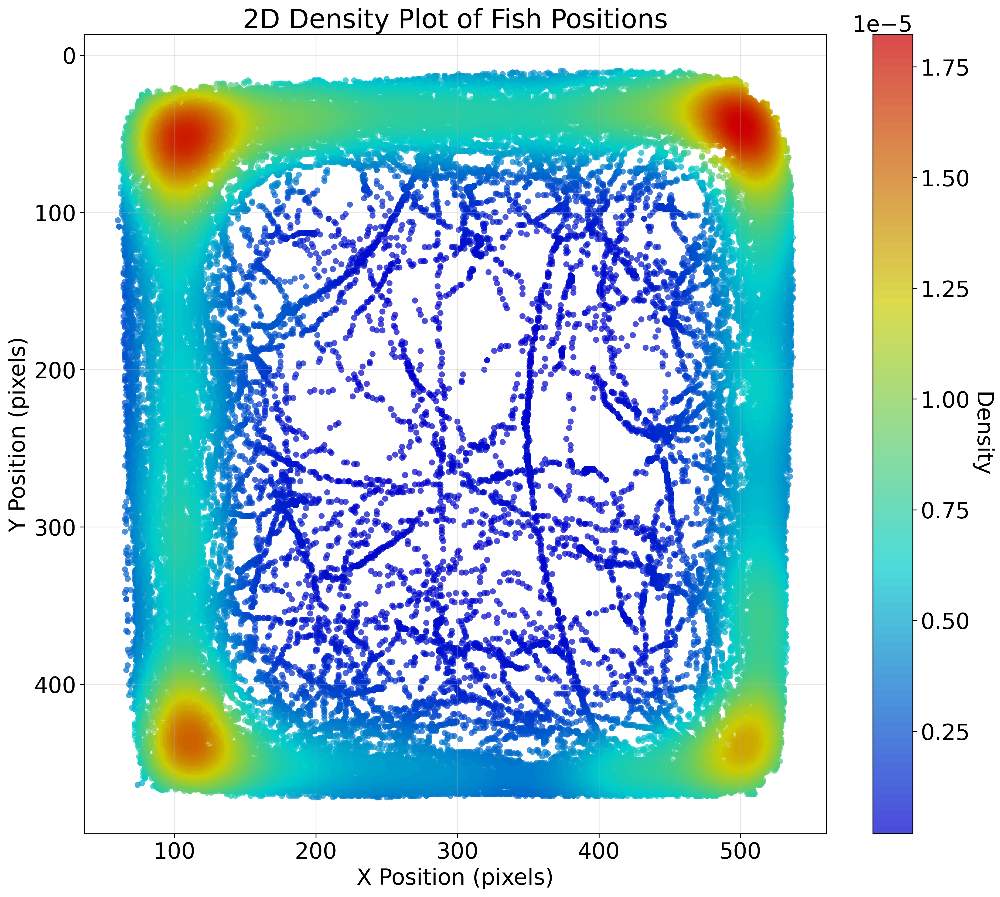

In [15]:
""" draw 3 samples from 02 group trajectory plot
    20251222_020002, 20251224_020001, 20251225_020001
    -> 02_total3.csv
"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import savgol_filter
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl

# default_fontsize = mpl.rcParams['font.size'] = 10.0
mpl.rcParams['font.size'] = 20

# step1. merge csv files
csv_files = [
    "trajectories_tidy/20251222_020002_1.csv",
    "trajectories_tidy/20251224_020001_1.csv",
    "trajectories_tidy/20251225_020001_1.csv",
]
csv_file = "02_total3.csv"

f = open(csv_file, "w", newline='')
writer = csv.DictWriter(f, fieldnames=["frame","x","y","roi_x","roi_y","area","velocity_x","velocity_y","velocity","acceleration"])
writer.writeheader()
for i in csv_files:
    reader = csv.DictReader(open(i, "r"))
    writer.writerows(reader)
f.close()

df = pd.read_csv(csv_file)

df = df.query('acceleration < 10000').query('frame < 1500*30')

# Extract filename for plot titles
filename = os.path.basename(csv_file)

# Create figure with subplots
# Create figure and axes with gridspec for better control
fig = plt.figure(figsize=(15, 13), dpi=300)
gs = gridspec.GridSpec(1, 1)

# 1. Create 2D density plot of x,y coordinates
ax1 = fig.add_subplot(gs[0, 0])

# Filter out any NaN values
valid_data = df.dropna(subset=['x', 'y'])

if len(valid_data) > 10:  # Need enough points for density estimation
    # Create a 2D density plot
    x = valid_data['x'].values
    y = valid_data['y'].values
    
    # Calculate the point density
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    
    # Create custom colormap (blue to red)
    colors = [(0, 0, 0.8), (0, 0.8, 0.8), (0.8, 0.8, 0), (0.8, 0, 0)]
    cmap_name = 'fish_density'
    cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=100)
    
    # Plot density
    scatter = ax1.scatter(x, y, c=z, s=30, alpha=0.7, cmap=cm, edgecolor='none')
    
    # Add colorbar to the specific Axes object (ax1)
    cbar = plt.colorbar(scatter, ax=ax1)
    cbar.set_label('Density', rotation=270, labelpad=20)
    
    # Set labels and title
    ax1.set_xlabel('X Position (pixels)')
    ax1.set_ylabel('Y Position (pixels)')
    ax1.set_title(f'2D Density Plot of Fish Positions')
    
    # Invert y-axis to match image coordinates (0,0 at top-left)
    ax1.invert_yaxis()
    
    # Add grid
    ax1.grid(True, alpha=0.3)
else:
    ax1.text(0.5, 0.5, 'Insufficient data for density plot', 
             horizontalalignment='center', verticalalignment='center',
             transform=ax1.transAxes, fontsize=14)

plt.show()


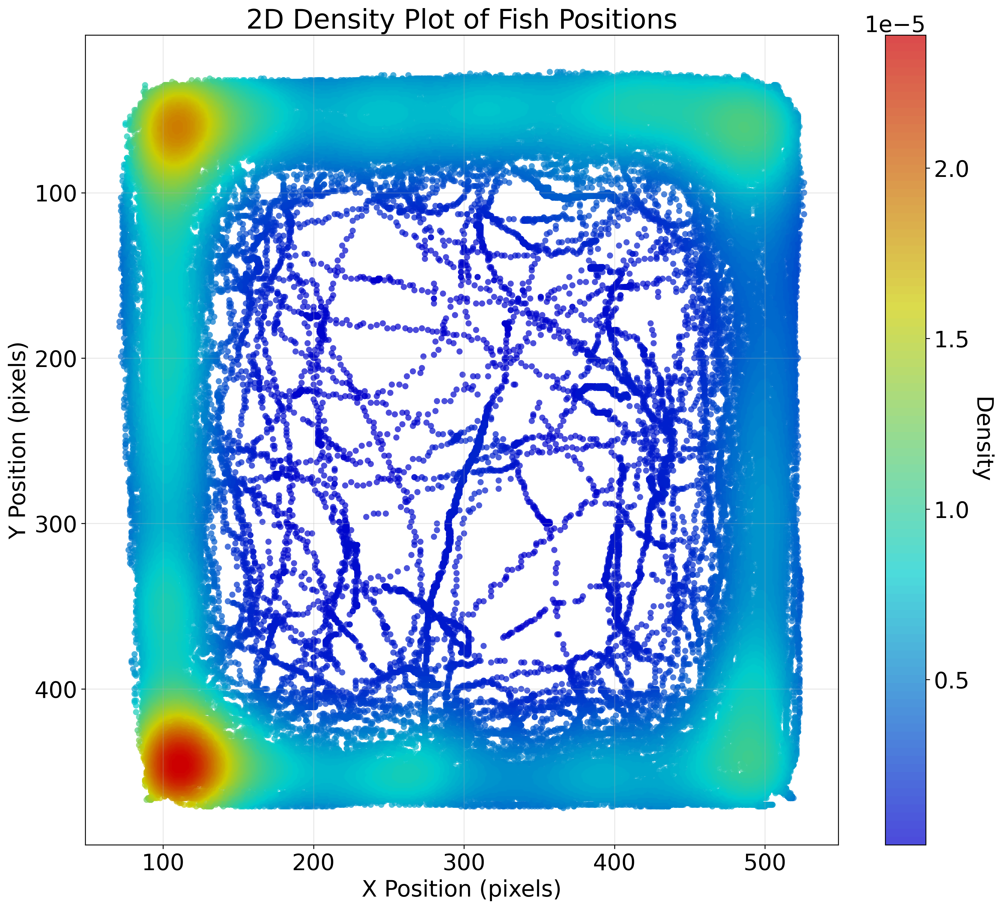

In [16]:
""" draw 3 samples from 07 group trajectory plot
    20251222_070004, 20251225_070005, 20251226_070004
    -> 07_total3.csv
"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.signal import savgol_filter
import os
import glob
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import csv
import matplotlib as mpl

# default_fontsize = mpl.rcParams['font.size'] = 10.0
mpl.rcParams['font.size'] = 20

csv_files = [
    "trajectories_tidy/20251222_070004_1.csv",
    "trajectories_tidy/fish_video_20251225_070005.csv",
    "trajectories_tidy/fish_video_20251226_070004.csv",
]
csv_file = "07_total3.csv"

f = open(csv_file, "w", newline='')
writer = csv.DictWriter(f, fieldnames=["frame","x","y","roi_x","roi_y","area","velocity_x","velocity_y","velocity","acceleration"])
writer.writeheader()
for i in csv_files:
    reader = csv.DictReader(open(i, "r"))
    writer.writerows(reader)
f.close()

df = pd.read_csv(csv_file)

df = df.query('acceleration < 10000').query('frame < 1500*30')

# Extract filename for plot titles
filename = os.path.basename(csv_file)

# Create figure with subplots
# Create figure and axes with gridspec for better control
fig = plt.figure(figsize=(15, 13), dpi=300)
gs = gridspec.GridSpec(1, 1)

# 1. Create 2D density plot of x,y coordinates
ax1 = fig.add_subplot(gs[0, 0])

# Filter out any NaN values
valid_data = df.dropna(subset=['x', 'y'])

if len(valid_data) > 10:  # Need enough points for density estimation
    # Create a 2D density plot
    x = valid_data['x'].values
    y = valid_data['y'].values
    
    # Calculate the point density
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    
    # Create custom colormap (blue to red)
    colors = [(0, 0, 0.8), (0, 0.8, 0.8), (0.8, 0.8, 0), (0.8, 0, 0)]
    cmap_name = 'fish_density'
    cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=100)
    
    # Plot density
    scatter = ax1.scatter(x, y, c=z, s=30, alpha=0.7, cmap=cm, edgecolor='none')
    
    # Add colorbar to the specific Axes object (ax1)
    cbar = plt.colorbar(scatter, ax=ax1)
    cbar.set_label('Density', rotation=270, labelpad=20)
    
    # Set labels and title
    ax1.set_xlabel('X Position (pixels)')
    ax1.set_ylabel('Y Position (pixels)')
    ax1.set_title(f'2D Density Plot of Fish Positions')
    
    # Invert y-axis to match image coordinates (0,0 at top-left)
    ax1.invert_yaxis()
    
    # Add grid
    ax1.grid(True, alpha=0.3)
else:
    ax1.text(0.5, 0.5, 'Insufficient data for density plot', 
             horizontalalignment='center', verticalalignment='center',
             transform=ax1.transAxes, fontsize=14)

plt.show()